# Installs & Imports

In [1]:
!pip install pyvirtualdisplay > /dev/null 2>&1
!apt-get install -y xvfb > /dev/null 2>&1
!apt-get install -y python3-opengl > /dev/null 2>&1
!apt-get install -y ffmpeg > /dev/null 2>&1

In [2]:
!pip install -q gymnasium mo-gymnasium gym-super-mario-bros stable-baselines3 opencv-python imageio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.7/77.7 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 958.1/958.1 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 479.6/479.6 kB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.1/199.1 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 43.5 MB/s eta 0:00:00


In [3]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

import os
import gymnasium as gym
from gymnasium.spaces import Box
from gymnasium import Wrapper
from gym_super_mario_bros.actions import SIMPLE_MOVEMENT, COMPLEX_MOVEMENT
import mo_gymnasium as mo_gym
from gymnasium.wrappers import (
    MaxAndSkipObservation, GrayscaleObservation, ResizeObservation,
    NormalizeObservation, TransformObservation, FrameStackObservation,
    RecordVideo
)
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.vec_env import DummyVecEnv, VecFrameStack
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.callbacks import BaseCallback, ProgressBarCallback
from stable_baselines3.common.env_checker import check_env
from stable_baselines3 import PPO
import numpy as np
import matplotlib.pyplot as plt
import torch
import cv2
import imageio
import base64
from IPython.display import display, Image, Video, HTML

import glob
import io
import uuid

from pyvirtualdisplay import Display as VirtualDisplay
virtual_display = VirtualDisplay(visible=0, size=(1400, 900))
virtual_display.start()

/usr/local/lib/python3.10/dist-packages/pygame/pkgdata.py:25: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import resource_stream, resource_exists
/usr/local/lib/python3.10/dist-packages/pkg_resources/__init__.py:3154: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('google')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  declare_namespace(pkg)
/usr/local/lib/python3.10/dist-packages/pkg_resources/__init__.py:3154: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('google.cloud')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-pa

In [4]:
from typing import List
import gymnasium as gym
from gym_super_mario_bros.actions import SIMPLE_MOVEMENT
from gymnasium import Env, Wrapper

class JoypadSpace(Wrapper):
    """An environment wrapper to convert binary to discrete action space."""

    # a mapping of buttons to binary values
    _button_map = {
        "right": 0b10000000,
        "left": 0b01000000,
        "down": 0b00100000,
        "up": 0b00010000,
        "start": 0b00001000,
        "select": 0b00000100,
        "B": 0b00000010,
        "A": 0b00000001,
        "NOOP": 0b00000000,
    }

    @classmethod
    def buttons(cls) -> List:
        """Return the buttons that can be used as actions."""
        return list(cls._button_map.keys())

    def __init__(self, env: Env, actions: List = SIMPLE_MOVEMENT, seed: int = None):
        """
        Initialize a new binary to discrete action space wrapper.

        Args:
            env: the environment to wrap
            actions: an ordered list of actions (as lists of buttons).
                The index of each button list is its discrete coded value
            seed: the seed for the environment's random number generator

        Returns:
            None

        """
        super().__init__(env)
        # create the new action space
        self.action_space = gym.spaces.Discrete(len(actions))
        # create the action map from the list of discrete actions
        self._action_map = {}
        self._action_meanings = {}
        # iterate over all the actions (as button lists)
        for action, button_list in enumerate(actions):
            # the value of this action's bitmap
            byte_action = 0
            # iterate over the buttons in this button list
            for button in button_list:
                byte_action |= self._button_map[button]
            # set this action maps value to the byte action value
            self._action_map[action] = byte_action
            self._action_meanings[action] = " ".join(button_list)

        # Set the seed if provided
        if seed is not None:
            self.env.reset(seed=seed)

    def step(self, action):
        """
        Take a step using the given action.

        Args:
            action (int): the discrete action to perform

        Returns:
            a tuple of:
            - (numpy.ndarray) the state as a result of the action
            - (float) the reward achieved by taking the action
            - (bool) a flag denoting whether the episode has ended
            - (dict) a dictionary of extra information

        """
        action = int(action)
        # take the step and record the output
        return self.env.step(self._action_map[action])

    def reset(self, seed=None, **kwargs):
        """
        Reset the environment.

        Args:
            seed (int): the seed for the environment's random number generator
            **kwargs: Additional arguments for the reset method

        Returns:
            The initial observation of the environment

        """
        return self.env.reset(seed=seed, **kwargs)

    def get_keys_to_action(self):
        """Return the dictionary of keyboard keys to actions."""
        # get the old mapping of keys to actions
        old_keys_to_action = self.env.unwrapped.get_keys_to_action()
        # invert the keys to action mapping to lookup key combos by action
        action_to_keys = {v: k for k, v in old_keys_to_action.items()}
        # create a new mapping of keys to actions
        keys_to_action = {}
        # iterate over the actions and their byte values in this mapper
        for action, byte in self._action_map.items():
            # get the keys to press for the action
            keys = action_to_keys[byte]
            # set the keys value in the dictionary to the current discrete act
            keys_to_action[keys] = action

        return keys_to_action

    def get_action_meanings(self):
        """Return a list of actions meanings."""
        actions = sorted(self._action_meanings.keys())
        return [self._action_meanings[action] for action in actions]


# explicitly define the outward facing API of this module
__all__ = [JoypadSpace.__name__]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Create the Environment

In [5]:
# List all available actions in SIMPLE_MOVEMENT
print("Available actions in SIMPLE_MOVEMENT:")
for idx, action in enumerate(SIMPLE_MOVEMENT):
    print(f"{idx}: {action}")

Available actions in SIMPLE_MOVEMENT:
0: ['NOOP']
1: ['right']
2: ['right', 'A']
3: ['right', 'B']
4: ['right', 'A', 'B']
5: ['A']
6: ['left']


In [6]:
# Create the base environment
env = mo_gym.make('mo-supermario-v0')
env = JoypadSpace(env, SIMPLE_MOVEMENT)

In [7]:
# Reset the environment
obs, info = env.reset()
print('Observation shape after reset:', obs.shape)
print('Observation dtype:', obs.dtype)

# Take a random action
action = env.action_space.sample()
print('Action:', action)

# Step the environment
obs, reward, terminated, truncated, info = env.step(action)
print('Next observation shape:', obs.shape)
print('Reward:', reward)
print('Terminated:', terminated)
print('Truncated:', truncated)
print('Info:', info)

# Convert obs to a numpy array
obs_array = np.array(obs)

# Check the observation shape and values
print('Observation shape:', obs_array.shape)
print('Observation min value:', obs_array.min())
print('Observation max value:', obs_array.max())

Observation shape after reset: (240, 256, 3)
Observation dtype: uint8
Action: 5
Next observation shape: (240, 256, 3)
Reward: [1.3333334 0.        0.        0.        0.       ]
Terminated: False
Truncated: False
Info: {'coins': 0, 'flag_get': False, 'life': 2, 'score': 0, 'stage': 1, 'status': 'small', 'time': 400, 'world': 1, 'x_pos': 40, 'y_pos': 79}
Observation shape: (240, 256, 3)
Observation min value: 0
Observation max value: 252


In [8]:
# Create the base environment
env = mo_gym.make('mo-supermario-v0')
env = JoypadSpace(env, SIMPLE_MOVEMENT)

# Reset and get the initial observation
obs_before_gray, info = env.reset()
print('Observation before Grayscale shape:', obs_before_gray.shape)
print('Observation before Grayscale dtype:', obs_before_gray.dtype)

# Apply the grayscaling
env = GrayscaleObservation(env, keep_dim=False)

# Reset and get the observation after grayscale
obs_after_gray, info = env.reset()
print('Observation after Grayscale shape:', obs_after_gray.shape)
print('Observation after Grayscale dtype:', obs_after_gray.dtype)

Observation before Grayscale shape: (240, 256, 3)
Observation before Grayscale dtype: uint8
Observation after Grayscale shape: (240, 256)
Observation after Grayscale dtype: uint8


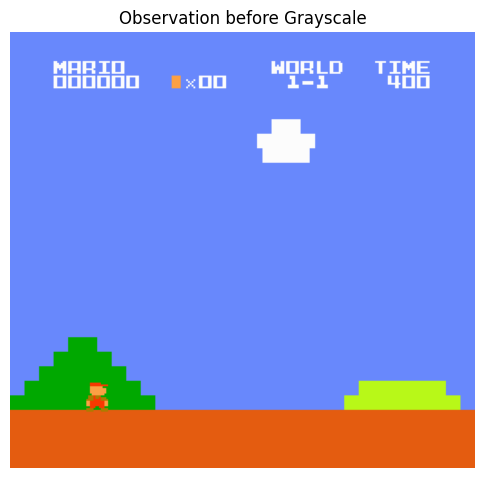

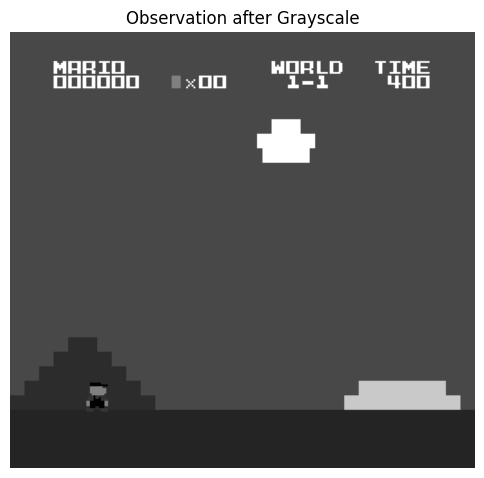

In [9]:
# Plot the observation before grayscale
plt.figure(figsize=(6, 6))
plt.imshow(obs_before_gray)
plt.title('Observation before Grayscale')
plt.axis('off')
plt.show()

# Plot the observation after grayscale
plt.figure(figsize=(6, 6))
plt.imshow(obs_after_gray, cmap='gray')
plt.title('Observation after Grayscale')
plt.axis('off')
plt.show()

In [10]:
!pip install -q renderlab

In [11]:
import renderlab as rl

/usr/local/lib/python3.10/dist-packages/moviepy/config_defaults.py:1: DeprecationWarning: invalid escape sequence '\P'
  """
/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:294: DeprecationWarning: invalid escape sequence '\d'
  lines_video = [l for l in lines if ' Video: ' in l and re.search('\d+x\d+', l)]
  from scipy.ndimage.filters import sobel

  if event.key is 'enter':



In [12]:
# Create the base environment
env = mo_gym.make('mo-supermario-v0', render_mode="rgb_array")
env = JoypadSpace(env, SIMPLE_MOVEMENT)

  and should_run_async(code)



In [13]:
from IPython.core.display import Video, display
from moviepy.editor import *

import gymnasium as gym
import time
import cv2
import os

class RenderFrame(gym.Wrapper):
    def __init__(self, env, directory, auto_release=True, size=None, fps=None, rgb=True):
        super().__init__(env)
        self.directory = directory
        self.auto_release = auto_release
        self.active = True
        self.rgb = rgb

        if env.render_mode != "rgb_array":
            raise Exception("RenderFrame requires environment render mode configured to rgb_array")

        os.makedirs(self.directory, exist_ok = True)

        if size is None:
            self.env.reset()
            rendered_frame = self.env.render()
            self.size = rendered_frame.shape[:2][::-1]
        else:
            self.size = size

        if fps is None:
            if 'video.frames_per_second' in self.env.metadata:
                self.fps = self.env.metadata['video.frames_per_second']
            else:
                self.fps = 30
        else:
            self.fps = fps

    def pause(self):
        self.active = False

    def resume(self):
        self.active = True

    def _start(self):
        self.cliptime = time.time()
        self.path = f'{self.directory}/{self.cliptime}.mp4'
        fourcc = cv2.VideoWriter_fourcc(*'MP4V')
        self._writer = cv2.VideoWriter(self.path, fourcc, self.fps, self.size)

    def _write(self):
        if self.active:
            frame = self.env.render()
            if self.rgb:
                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            self._writer.write(frame)

    def release(self):
        self._writer.release()

    def reset(self, *args, **kwargs):
        observation, info = self.env.reset(*args, **kwargs)
        self._start()
        self._write()
        return observation, info

    def step(self, *args, **kwargs):
        observation, reward, terminated, truncated, info = self.env.step(*args, **kwargs)
        self._write()

        if self.auto_release and (terminated or truncated):
            self.release()

        return observation, reward, terminated, truncated, info

    def play(self):
        start = time.time()
        filename = 'temp-{start}.mp4'
        clip = VideoFileClip(self.path)
        clip.write_videofile(filename, verbose = False)
        display(Video(filename, embed = True))
        os.remove(filename)

In [14]:
# Wrap in RenderFrame
env = RenderFrame(env, "./output")

See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(



In [15]:
# Perform random actions
obs, info = env.reset()

while True:
  action = env.action_space.sample()
  obs, reward, terminated, truncated, info = env.step(action)

  if terminated or truncated:
      break

In [16]:
# Display the video
env.play()

Moviepy - Building video temp-{start}.mp4.
Moviepy - Writing video temp-{start}.mp4



t:  99%|█████████▉| 7976/8022 [00:05<00:00, 1420.79it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file ./output/1733517954.049155.mp4, 184320 bytes wanted but 0 bytes read,at frame 8021/8022, at time 267.37/267.37 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

                                                                  

Moviepy - Done !
Moviepy - video ready temp-{start}.mp4


In [17]:
class SumRewards(Wrapper):
    def __init__(self, env):
        super(SumRewards, self).__init__(env)

    def step(self, action):
        obs, rewards, terminated, truncated, info = self.env.step(action)
        # Sum the rewards if it's an array, else keep it as is
        if isinstance(rewards, (list, np.ndarray)):
            total_reward = float(np.sum(rewards))
        else:
            total_reward = float(rewards)
        return obs, total_reward, terminated, truncated, info

In [18]:
class FixObservationShape(Wrapper):
    def __init__(self, env):
        super().__init__(env)
        self.observation_space = env.observation_space  # Keep the declared observation space unchanged

    def reset(self, **kwargs):
        obs, info = self.env.reset(**kwargs)
        return self._fix_shape(obs), info

    def step(self, action):
        obs, reward, terminated, truncated, info = self.env.step(action)
        return self._fix_shape(obs), reward, terminated, truncated, info

    def _fix_shape(self, obs):
        # If the observation is 2D, add a channel dimension
        if len(obs.shape) == 2:
            obs = np.expand_dims(obs, axis=-1)
        return obs

In [19]:
def make_env():
    # Create the base environment
    env = mo_gym.make('mo-supermario-v0', render_mode="rgb_array")
    env = SumRewards(env)  # Need a scalar float reward for StableBaselines
    env = JoypadSpace(env, SIMPLE_MOVEMENT)
    print('Observation space before wrappers:', env.observation_space)

    # Apply grayscale observation
    env = GrayscaleObservation(env, keep_dim=True)
    print('Observation space after grayscaling:', env.observation_space)

    # Resize the observation
    env = ResizeObservation(env, (84, 84))
    print('Observation space after resizing:', env.observation_space)

    # Fix observation shape
    env = FixObservationShape(env)
    print('Observation space after fixing shape:', env.observation_space)

    # Test reset and print actual observation shape
    obs, _ = env.reset()
    print('Actual observation shape after reset:', obs.shape)

    # Check the environment
    check_env(env)

    # Vectorize and stack frames
    env = DummyVecEnv([lambda: env])  # Vectorize the environment
    env = VecFrameStack(env, n_stack=4)  # Stack frames
    print('Observation space after stacking:', env.observation_space)

    return env

# Create the environment
env = make_env()

Observation space before wrappers: Box(0, 255, (240, 256, 3), uint8)
Observation space after grayscaling: Box(0, 255, (240, 256, 1), uint8)
Observation space after resizing: Box(0, 255, (84, 84, 1), uint8)
Observation space after fixing shape: Box(0, 255, (84, 84, 1), uint8)
Actual observation shape after reset: (84, 84, 1)
Observation space after stacking: Box(0, 255, (84, 84, 4), uint8)


# Train the Agent

In [20]:
class TrainAndLoggingCallback(BaseCallback):
    def __init__(self, check_freq, save_path, verbose=1):
        super(TrainAndLoggingCallback, self).__init__(verbose)
        self.check_freq = check_freq
        self.save_path = save_path

    def _init_callback(self):
        if self.save_path is not None:
            os.makedirs(self.save_path, exist_ok=True)

    def _on_step(self):
        if self.n_calls % self.check_freq == 0:
            model_path = os.path.join(self.save_path, f'best_model_{self.n_calls}')
            self.model.save(model_path)
            if self.verbose > 0:
                print(f"Saving model checkpoint to {model_path}")
        return True

In [21]:
# Define directories for saving models and logs
CHECKPOINT_DIR = './ppo_train/'
LOG_DIR = './ppo_logs/'

# Create the callback
log_callback = TrainAndLoggingCallback(check_freq=50000, save_path=CHECKPOINT_DIR)

In [22]:
# Initialize PPO
model = PPO(
    'CnnPolicy',
    env,
    tensorboard_log=LOG_DIR,
    learning_rate=1e-4,
    n_steps=512,
    batch_size=64,
    gamma=0.99,
    gae_lambda=0.95,
    clip_range=0.2,
    ent_coef=0.01
)

# Start training
model.learn(
    total_timesteps=1000000,
    callback=log_callback,
    progress_bar=True
)

Output()

Saving model checkpoint to ./ppo_train/best_model_50000

Saving model checkpoint to ./ppo_train/best_model_100000

Saving model checkpoint to ./ppo_train/best_model_150000

Saving model checkpoint to ./ppo_train/best_model_200000

Saving model checkpoint to ./ppo_train/best_model_250000

Saving model checkpoint to ./ppo_train/best_model_300000

Saving model checkpoint to ./ppo_train/best_model_350000

Saving model checkpoint to ./ppo_train/best_model_400000

Saving model checkpoint to ./ppo_train/best_model_450000

Saving model checkpoint to ./ppo_train/best_model_500000

Saving model checkpoint to ./ppo_train/best_model_550000

Saving model checkpoint to ./ppo_train/best_model_600000

Saving model checkpoint to ./ppo_train/best_model_650000

Saving model checkpoint to ./ppo_train/best_model_700000

Saving model checkpoint to ./ppo_train/best_model_750000

Saving model checkpoint to ./ppo_train/best_model_800000

Saving model checkpoint to ./ppo_train/best_model_850000

Saving model checkpoint to ./ppo_train/best_model_900000

Saving model checkpoint to ./ppo_train/best_model_950000

Saving model checkpoint to ./ppo_train/best_model_1000000

In [23]:
# Save the final model
model_path = os.path.join(CHECKPOINT_DIR, 'final_model')
model.save(model_path)

  and should_run_async(code)



In [24]:
# Load the model
CHECKPOINT_DIR = './ppo_train/'
model_path = os.path.join(CHECKPOINT_DIR, 'final_model')
loaded_model = PPO.load(model_path)
print("Model's observation space:", loaded_model.observation_space)

Model's observation space: Box(0, 255, (4, 84, 84), uint8)


In [25]:
def make_processed_env():
    env = mo_gym.make('mo-supermario-v0', render_mode="rgb_array")
    env = SumRewards(env)
    env = JoypadSpace(env, SIMPLE_MOVEMENT)
    env = GrayscaleObservation(env, keep_dim=True)
    env = ResizeObservation(env, (84, 84))
    env = FixObservationShape(env)
    env = DummyVecEnv([lambda: env])
    env = VecFrameStack(env, n_stack=4)
    return env

test_env = make_processed_env()

In [26]:
# Test the loaded model
obs = test_env.reset()
print("Observation shape:", obs.shape)

for _ in range(10):
    # Predict the next action
    action, _state = loaded_model.predict(obs)

    # Perform the step in the environment
    obs, reward, done, info = test_env.step(action)

    print(f"Action taken: {action}, Reward received: {reward}")

    # Reset the environment if the episode ends
    if done:
        obs = test_env.reset()

test_env.close()

Observation shape: (1, 84, 84, 4)
Action taken: [2], Reward received: [1.3333334]
Action taken: [5], Reward received: [0.]
Action taken: [5], Reward received: [0.]
Action taken: [3], Reward received: [0.]
Action taken: [3], Reward received: [0.]
Action taken: [3], Reward received: [0.]
Action taken: [3], Reward received: [0.03333334]
Action taken: [3], Reward received: [0.]
Action taken: [3], Reward received: [0.]
Action taken: [3], Reward received: [0.03333334]


In [27]:
%load_ext tensorboard
%tensorboard --logdir ./ppo_logs/

<IPython.core.display.Javascript object>

# Gameplay View

In [28]:
!pip install -q renderlab

  and should_run_async(code)



In [29]:
import renderlab as rl

In [30]:
def make_render_env():
    env = mo_gym.make('mo-supermario-v0', render_mode="rgb_array")
    env = JoypadSpace(env, SIMPLE_MOVEMENT)
    env = RenderFrame(env, "./gameplay")
    return env

In [31]:
# Record actions from processed environment
processed_env = make_processed_env()
obs = processed_env.reset()
recorded_actions = []
max_steps = 100000

for step in range(max_steps):
    # Predict the next action
    action, _state = loaded_model.predict(obs, deterministic=True)
    recorded_actions.append(action)

    obs, reward, done, info = processed_env.step(action)

    # Check if the episode is over
    if done:
        break

# Clean up the environment
processed_env.close()
print(f"Number of actions recorded: {len(recorded_actions)}")

Number of actions recorded: 2494


In [32]:
# Replay recorded actions in render environment
render_env = make_render_env()
obs, info = render_env.reset()

print("Replaying actions in render environment...")

for step_i, action in enumerate(recorded_actions):
    # Ensure action is a scalar integer
    if isinstance(action, np.ndarray):
        action = action.item()
    action = int(action)

    obs, reward, terminated, truncated, info = render_env.step(action)

    if terminated or truncated:
        break

See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(



Replaying actions in render environment...


In [33]:
# Display the video
render_env.play()

Moviepy - Building video temp-{start}.mp4.
Moviepy - Writing video temp-{start}.mp4



t:  97%|█████████▋| 2429/2496 [00:01<00:00, 1467.07it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file ./gameplay/1733526941.2730498.mp4, 184320 bytes wanted but 0 bytes read,at frame 2495/2496, at time 83.17/83.17 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

                                                                  

Moviepy - Done !
Moviepy - video ready temp-{start}.mp4


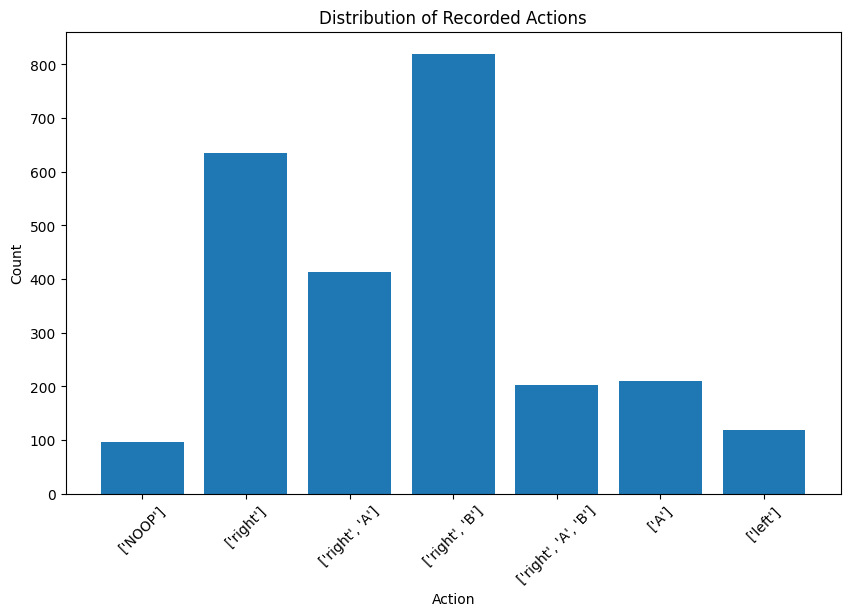

In [34]:
# Ensure all actions are integers
recorded_actions = [
    int(action.item()) if isinstance(action, np.ndarray) else int(action)
    for action in recorded_actions
]

# Plot recorded actions distribution
plt.figure(figsize=(10, 6))

# Define the number of bins based on the length of SIMPLE_MOVEMENT
bins = np.arange(len(SIMPLE_MOVEMENT) + 1)

# Plot the histogram
plt.hist(recorded_actions, bins=bins, align='left', rwidth=0.8)

# Set xticks to correspond to action names
plt.xticks(np.arange(len(SIMPLE_MOVEMENT)), SIMPLE_MOVEMENT, rotation=45)

# Add labels and title
plt.xlabel('Action')
plt.ylabel('Count')
plt.title('Distribution of Recorded Actions')

plt.show()